# Import Libraries:

In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import make_scorer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
sns.set_style("white")

# Load Datasets:

In [2]:
sample = pd.read_csv("sample_submission.csv")
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

In [3]:
train['test'] = 0
test['test'] = 1
df = pd.concat([train, test], axis=0)

### Understand the nature of the data:

In [4]:
df.isnull().sum()

ID_LAT_LON_YEAR_WEEK             0
latitude                         0
longitude                        0
year                             0
week_no                          0
                             ...  
Cloud_sensor_zenith_angle      650
Cloud_solar_azimuth_angle      650
Cloud_solar_zenith_angle       650
emission                     24353
test                             0
Length: 77, dtype: int64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 103376 entries, 0 to 24352
Data columns (total 77 columns):
 #   Column                                                    Non-Null Count   Dtype  
---  ------                                                    --------------   -----  
 0   ID_LAT_LON_YEAR_WEEK                                      103376 non-null  object 
 1   latitude                                                  103376 non-null  float64
 2   longitude                                                 103376 non-null  float64
 3   year                                                      103376 non-null  int64  
 4   week_no                                                   103376 non-null  int64  
 5   SulphurDioxide_SO2_column_number_density                  82625 non-null   float64
 6   SulphurDioxide_SO2_column_number_density_amf              82625 non-null   float64
 7   SulphurDioxide_SO2_slant_column_number_density            82625 non-null   float64
 8   SulphurDio

> **All Data is numerical and have lots of null values**

In [6]:
{col.split('_')[0] for col in df.columns}

{'CarbonMonoxide',
 'Cloud',
 'Formaldehyde',
 'ID',
 'NitrogenDioxide',
 'Ozone',
 'SulphurDioxide',
 'UvAerosolIndex',
 'UvAerosolLayerHeight',
 'emission',
 'latitude',
 'longitude',
 'test',
 'week',
 'year'}

**Features not used for indexing (latitude, longitude, year and week number) can be split into 8 groups: CarbonMonoxide, Cloud, Formaldehyde, NitrogenDioxide, Ozone, SulphurDioxide, UvAerosolIndex and UvAerosolLayerHeight.**

In [7]:
missing = df.isnull().sum()
missing[missing > 0].sort_values(ascending = False).head(20)

UvAerosolLayerHeight_solar_zenith_angle                    100844
UvAerosolLayerHeight_solar_azimuth_angle                   100844
UvAerosolLayerHeight_sensor_azimuth_angle                  100844
UvAerosolLayerHeight_sensor_zenith_angle                   100844
UvAerosolLayerHeight_aerosol_optical_depth                 100844
UvAerosolLayerHeight_aerosol_pressure                      100844
UvAerosolLayerHeight_aerosol_height                        100844
emission                                                    24353
NitrogenDioxide_sensor_altitude                             23975
NitrogenDioxide_stratospheric_NO2_column_number_density     23975
NitrogenDioxide_tropospheric_NO2_column_number_density      23975
NitrogenDioxide_NO2_column_number_density                   23975
NitrogenDioxide_absorbing_aerosol_index                     23975
NitrogenDioxide_cloud_fraction                              23975
NitrogenDioxide_solar_zenith_angle                          23975
NitrogenDi

> * **Missing values:** only columns used for indexing and target don't have missing values.
> * **Missing values:** Features from the UvAerosolLayerHeight group have over 99% missing values. Those columns will propably be removed later.

In [8]:
df.isnull().groupby(df['year']).sum().sum(axis=1)

year
2019    309254
2020    333338
2021    347499
2022    345182
dtype: int64

In [9]:
df[df.columns[df.isna().mean() > 0]].isna().mean()

SulphurDioxide_SO2_column_number_density          0.200733
SulphurDioxide_SO2_column_number_density_amf      0.200733
SulphurDioxide_SO2_slant_column_number_density    0.200733
SulphurDioxide_cloud_fraction                     0.200733
SulphurDioxide_sensor_azimuth_angle               0.200733
                                                    ...   
Cloud_sensor_azimuth_angle                        0.006288
Cloud_sensor_zenith_angle                         0.006288
Cloud_solar_azimuth_angle                         0.006288
Cloud_solar_zenith_angle                          0.006288
emission                                          0.235577
Length: 71, dtype: float64

**There are a bunch of features which we need to fill or remove.**

In [10]:
df[['year', 'emission']].describe()

,year,emission
count,103376.000000,79023.000000
mean,2020.471154,81.940552
std,1.109031,144.299648
min,2019.000000,0.000000
25%,2019.000000,9.797995
50%,2020.000000,45.593445
75%,2021.000000,109.549595
max,2022.000000,3167.768000


# Data Visualization

In [11]:
train_plot = df.copy(deep=True)
train_plot['date'] = pd.to_datetime(train_plot['year'].astype(str) + '-' + train_plot['week_no'].astype(str) + '-1', format='%Y-%W-%w')

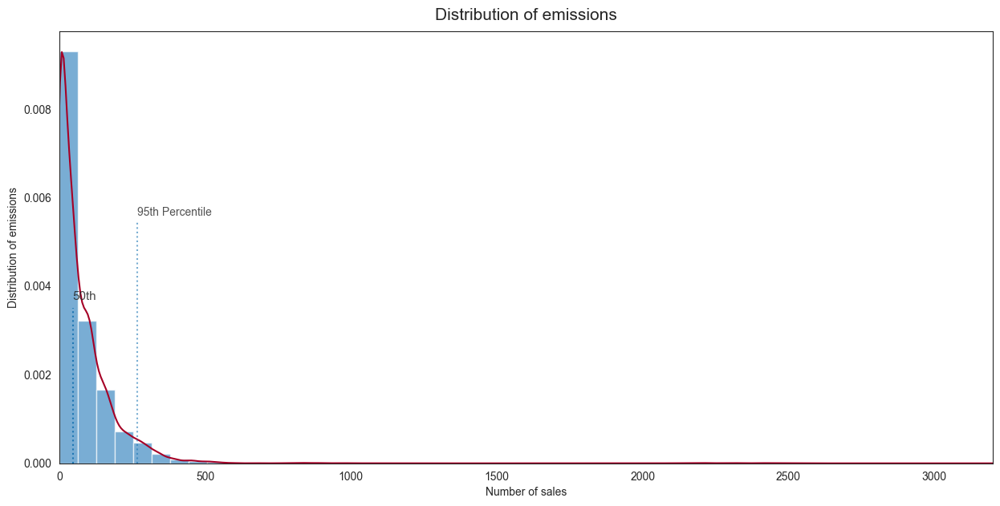

In [12]:
# Plot
df['emission'].plot(kind = "hist", density = True, alpha = 0.65, bins = 50, colormap='tab20c', figsize=(15,10)) # change density to true, because KDE uses density
df['emission'].plot(kind = "kde", colormap='RdYlBu', figsize=(15,7))

# Quantile lines
quant_50, quant_95 = df['emission'].quantile(0.5), df['emission'].quantile(0.95)
quants = [[quant_50, 1, 0.36],  [quant_95, 0.6, 0.56]]
for i in quants:
    plt.axvline(i[0], alpha = i[1], ymax = i[2], linestyle = ":")

# X
plt.xlabel('Number of sales')
plt.xlim((0, 3200))

# Y
plt.ylabel('Distribution of emissions')

# # Annotations
plt.text(quant_50, .0037, "50th", size=11, alpha=.85)
plt.text(quant_95, .0056, "95th Percentile", size=10, alpha=.8)

plt.title('Distribution of emissions', size=15, pad=10)
plt.show()

**Most of emission readings aren't higher than 200.**

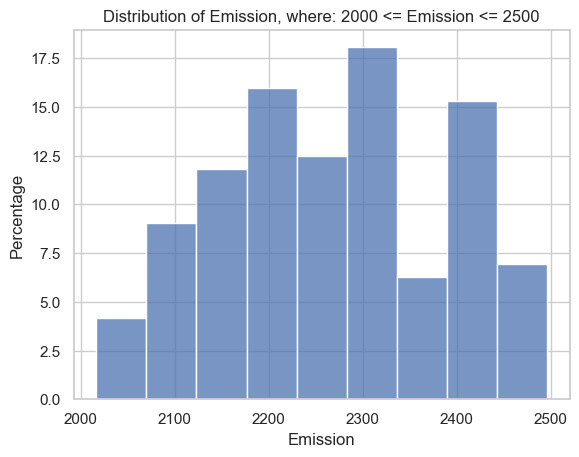

In [13]:
sns.set(style="whitegrid")

plot = sns.histplot(data = df.loc[(df['emission'] > 2000) & (df['emission'] < 2500)], x='emission', stat='percent', palette="Set1")

plot.set_title('Distribution of Emission, where: 2000 <= Emission <= 2500')
plt.xlabel('Emission')
plt.ylabel('Percentage')

plt.show()

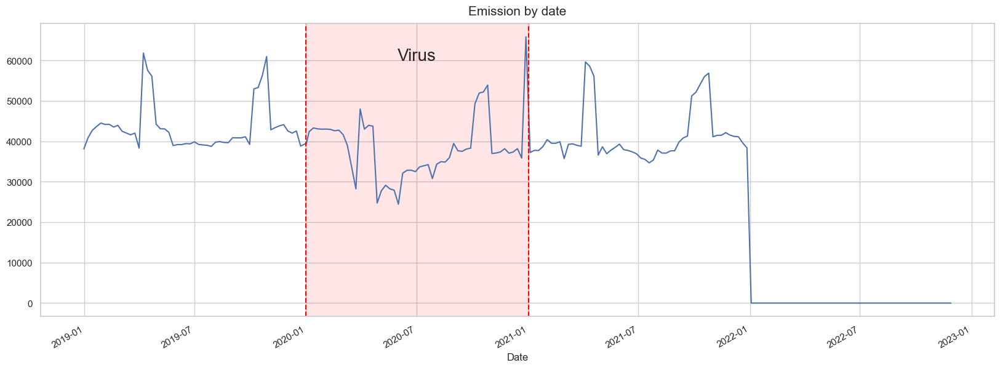

In [14]:
train_plot.groupby(['date'])['emission'].sum().plot(kind='line', figsize=(20, 7), xlabel='Date')

plt.axvspan(pd.Timestamp('2020-01-01'), pd.Timestamp('2021-01-01'), color='red', alpha=0.1)
plt.axvline(pd.Timestamp('2020-01-01'), linestyle = "--", color='red')
plt.axvline(pd.Timestamp('2021-01-01'), linestyle = "--", color='red')

plt.text(pd.Timestamp ('2020-05-30'), 60000, "Virus", size = 20)

plt.title('Emission by date', size=15, pad=10)
plt.show()

>**Covid effect:** We can see strong affect of virus especially in Q2 of 2020. Because this year contains unique trends it is an outlier it may introduce overfitting to our model so will deal with it later in preprocessing.

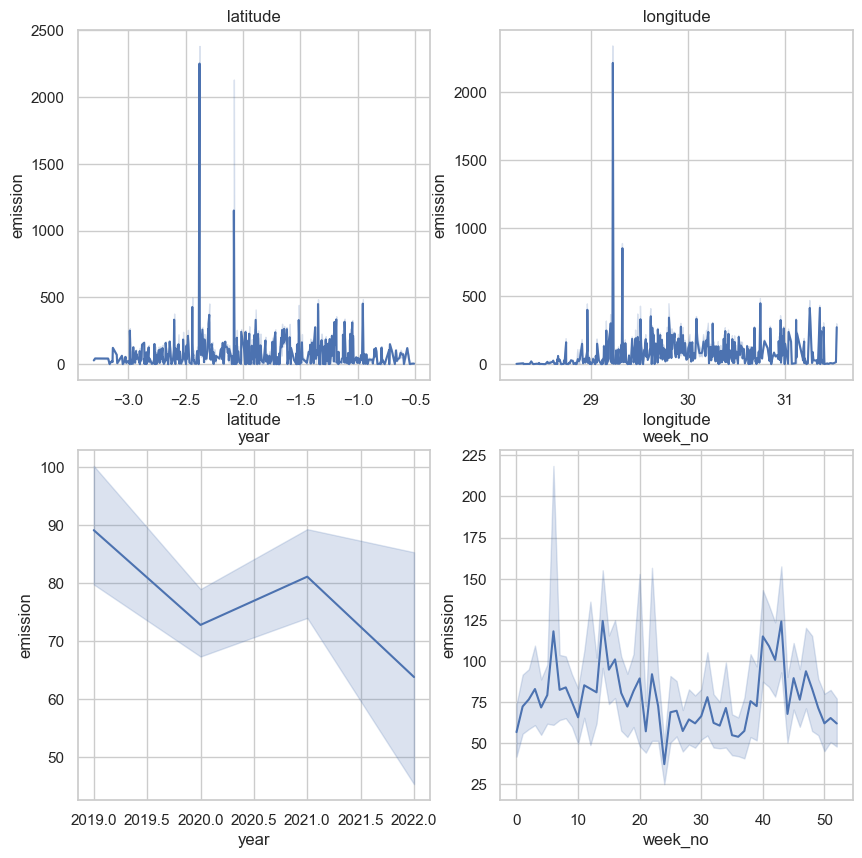

In [15]:
plt.figure(figsize=(10,10))

a = 1
for i in ['latitude', 'longitude', 'year', 'week_no']:
    plt.subplot(2, 2, a)
    sns.lineplot(df.sample(5000), x = i, y = 'emission', palette = "flare");
    plt.gca().set_title(i)
    a += 1
plt.show()

In [16]:
#remove 2020 for this plot
mask = train_plot['date'].dt.year != 2020
train_plot_no_2020 = train_plot[mask]

In [17]:
import plotly.express as px
for i in df['year'].unique():
    print('Emission in year '+str(i))
    print()
    fig = px.scatter_mapbox(df[df['year']==i], lat='latitude', lon='longitude', color="emission", animation_frame = 'week_no', zoom=6)
    #fig.update_layout(title='Emission in year '+str(i))
    fig.update_layout(mapbox_style = "open-street-map")
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    fig.update_layout(title='Emission in year '+str(i))
    fig.show()

Emission in year 2019



Emission in year 2020



Emission in year 2021



Emission in year 2022



# Feature Engneering

In [18]:
df['date'] = pd.to_datetime(df['year'].astype(str) + '-' + df['week_no'].astype(str) + '-1', format='%Y-%W-%w') 

In [19]:
features = df.columns[1:78]

target = 'emission'

In [20]:
missing_ratios = df[features].isnull().mean()
columns_to_drop = missing_ratios[missing_ratios > 0.4].index
df = df.drop(columns_to_drop, axis=1)

In [21]:
features = df.columns[1:68]

imputer = SimpleImputer()
df[features] = imputer.fit_transform(df[features])

In [22]:
avg_emission_non_virus = df[df['year'].isin((2019, 2021))].groupby('week_no')['emission'].mean()
avg_emission_virus = df[df['year'] == 2020].groupby('week_no')['emission'].mean()

ratios_for_weeks = avg_emission_non_virus / avg_emission_virus

virus_year_rows = df['year'] == 2020
df.loc[virus_year_rows, 'emission'] *= ratios_for_weeks.reindex(df[virus_year_rows]['week_no']).values

## Drop unwanted columns 

In [23]:
sulphur_dioxide_data=['SulphurDioxide_SO2_column_number_density',
       'SulphurDioxide_SO2_slant_column_number_density',
       'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle',
       'SulphurDioxide_sensor_zenith_angle',
       'SulphurDioxide_solar_azimuth_angle',
       'SulphurDioxide_SO2_column_number_density_15km','emission']
carbon_dioxide_data=['CarbonMonoxide_CO_column_number_density',
       'CarbonMonoxide_H2O_column_number_density',
       'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_azimuth_angle',
       'CarbonMonoxide_solar_azimuth_angle',
       'CarbonMonoxide_solar_zenith_angle','emission']
nitrogen_dioxide_data=['NitrogenDioxide_NO2_column_number_density',
       'NitrogenDioxide_stratospheric_NO2_column_number_density',
       'NitrogenDioxide_NO2_slant_column_number_density',
       'NitrogenDioxide_absorbing_aerosol_index',
       'NitrogenDioxide_cloud_fraction', 'NitrogenDioxide_sensor_altitude',
       'NitrogenDioxide_sensor_azimuth_angle',
       'NitrogenDioxide_sensor_zenith_angle',
       'NitrogenDioxide_solar_azimuth_angle',
       'NitrogenDioxide_solar_zenith_angle','emission']
formaldehyde_data=['Formaldehyde_tropospheric_HCHO_column_number_density',
       'Formaldehyde_tropospheric_HCHO_column_number_density_amf',
       'Formaldehyde_HCHO_slant_column_number_density',
       'Formaldehyde_solar_zenith_angle', 'Formaldehyde_solar_azimuth_angle',
       'Formaldehyde_sensor_zenith_angle', 'Formaldehyde_sensor_azimuth_angle','emission']
uvaerosol_data=['UvAerosolIndex_absorbing_aerosol_index',
       'UvAerosolIndex_sensor_altitude', 'UvAerosolIndex_sensor_azimuth_angle',
       'UvAerosolIndex_sensor_zenith_angle',
       'UvAerosolIndex_solar_azimuth_angle',
       'UvAerosolIndex_solar_zenith_angle',]
ozone_data=['Ozone_O3_column_number_density',
       'Ozone_O3_column_number_density_amf',
       'Ozone_O3_slant_column_number_density',
       'Ozone_O3_effective_temperature', 'Ozone_sensor_azimuth_angle',
       'Ozone_sensor_zenith_angle', 'Ozone_solar_azimuth_angle',
       'Ozone_solar_zenith_angle','emission']
cloud_data=['Cloud_cloud_top_pressure',
       'Cloud_cloud_top_height', 'Cloud_cloud_base_pressure',
       'Cloud_cloud_base_height', 'Cloud_surface_albedo',
       'Cloud_sensor_azimuth_angle', 'Cloud_sensor_zenith_angle',
       'Cloud_solar_azimuth_angle', 'Cloud_solar_zenith_angle', 'emission']
all_gases=[sulphur_dioxide_data,carbon_dioxide_data,nitrogen_dioxide_data,formaldehyde_data,uvaerosol_data,ozone_data,cloud_data]

<Figure size 600x600 with 0 Axes>

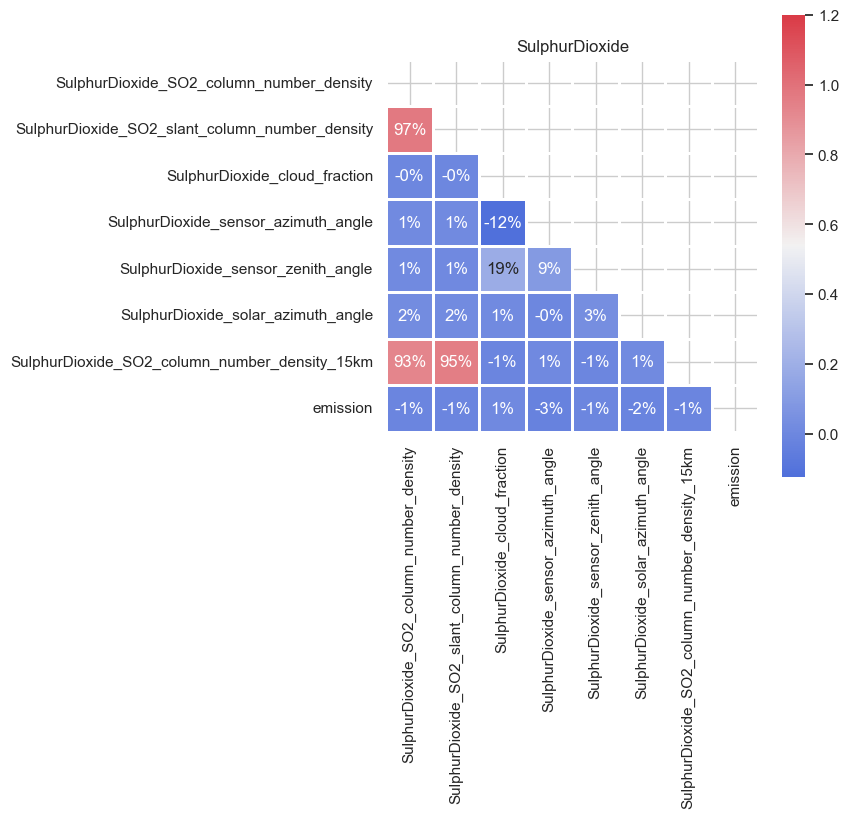

<Figure size 600x600 with 0 Axes>

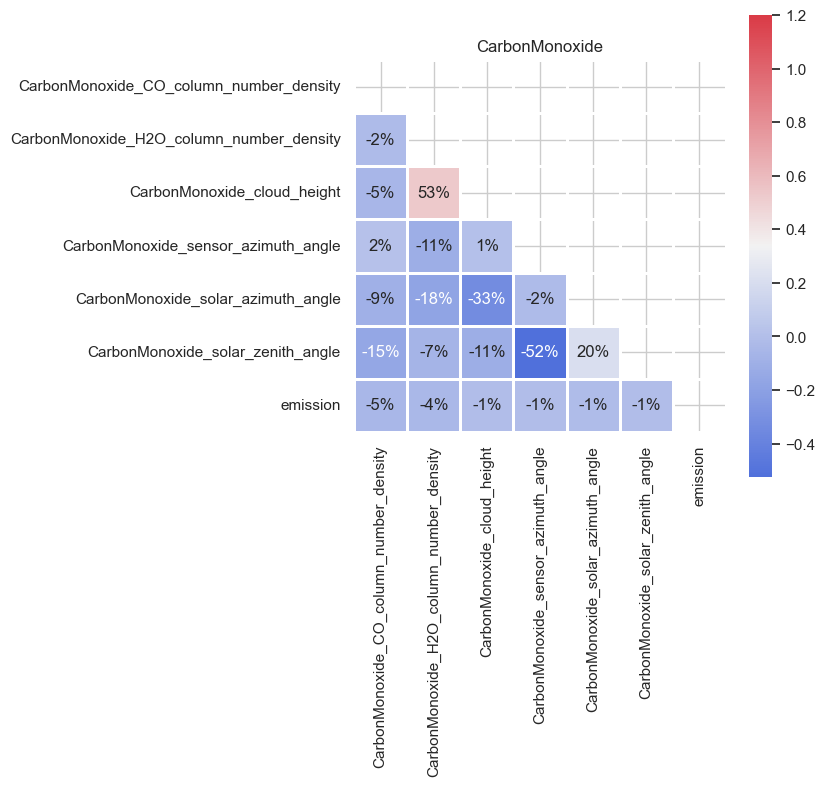

<Figure size 600x600 with 0 Axes>

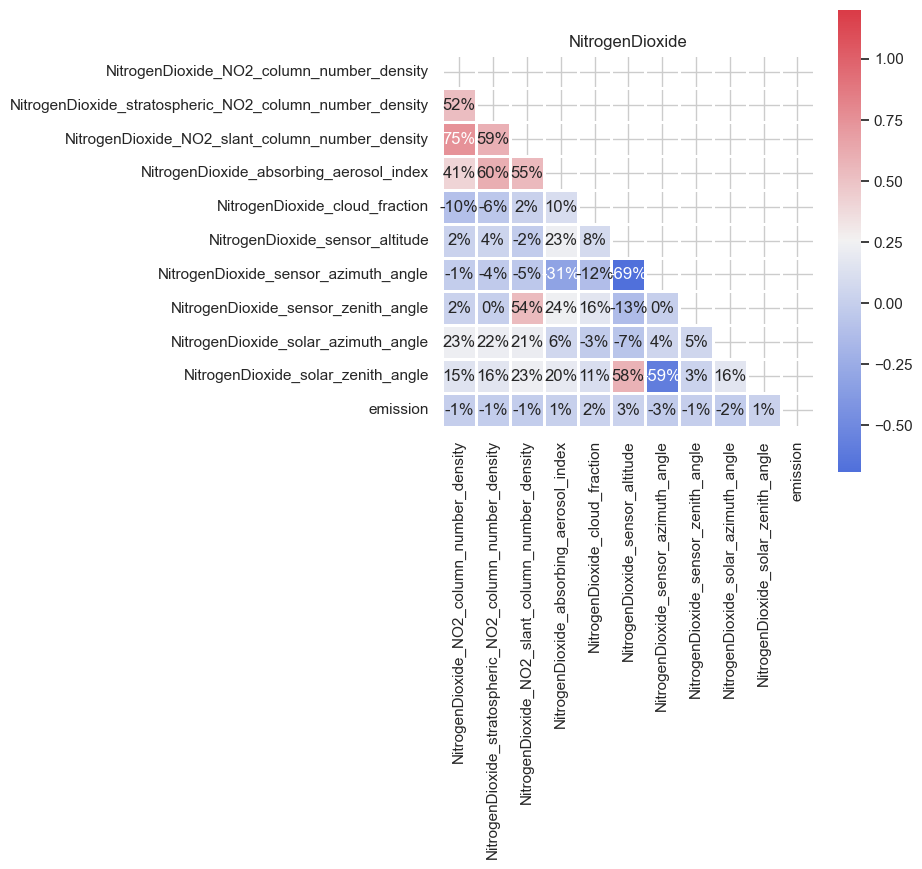

<Figure size 600x600 with 0 Axes>

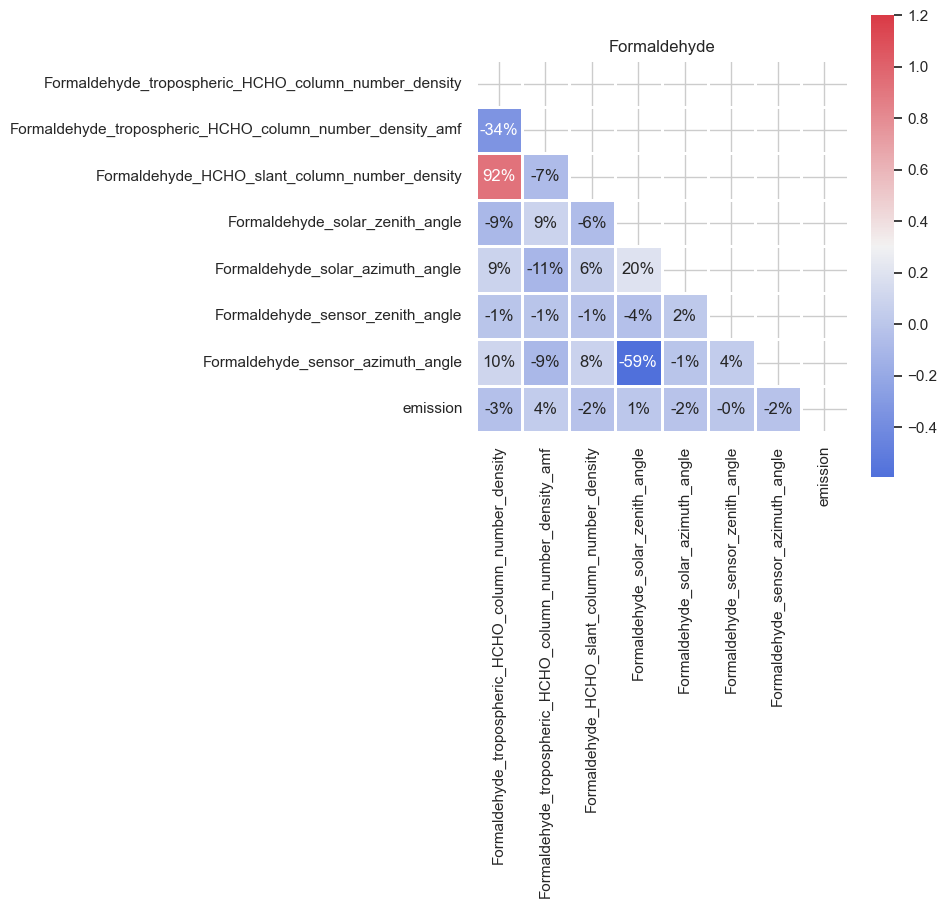

<Figure size 600x600 with 0 Axes>

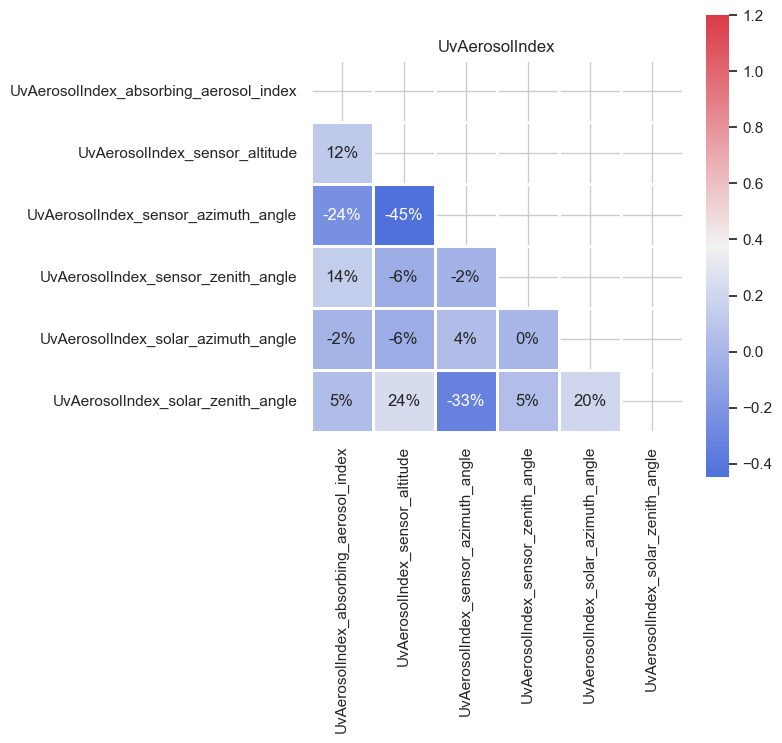

<Figure size 600x600 with 0 Axes>

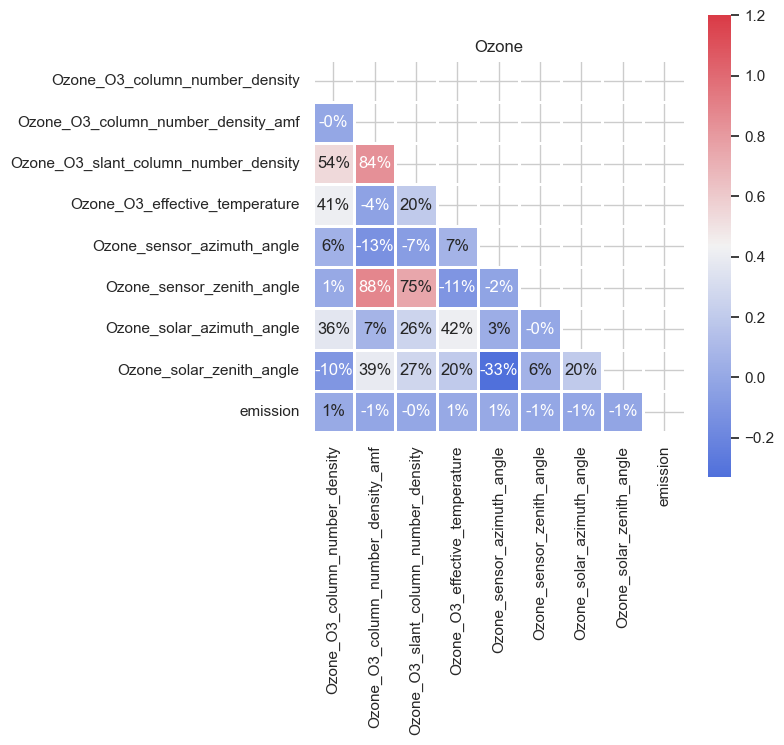

<Figure size 600x600 with 0 Axes>

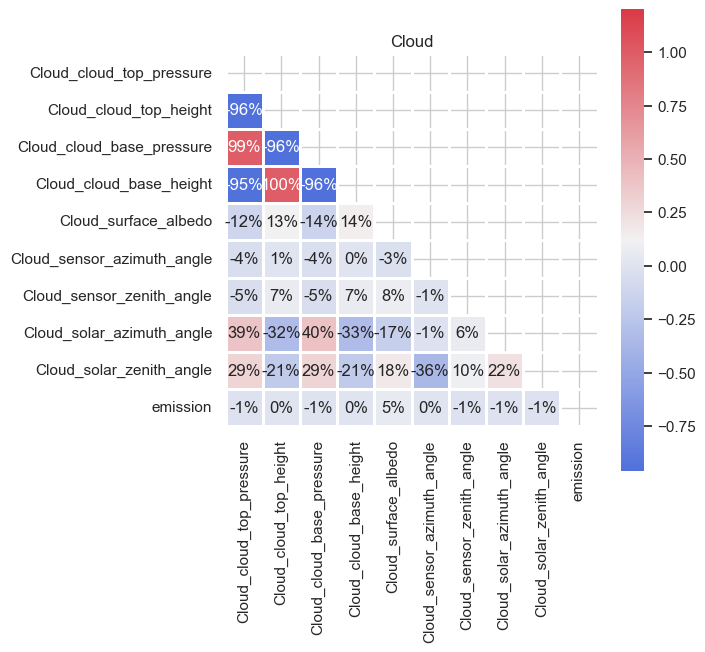

In [24]:
a=1
for i in all_gases:
    plt.figure(figsize=(6, 6))
    corr = df[i].corr()
    mask = np.zeros_like(corr, dtype = np.bool)
    mask[np.triu_indices_from(mask)] = True
    data, ax = plt.subplots(figsize=(6, 6))
    cmap = sns.diverging_palette(260, 10, as_cmap=True)
    sns.heatmap(corr, annot=True, vmax=1.2, square='square', cmap = cmap,
                mask = mask, fmt='.0%', ax=ax, linewidths=2).set_title(i[0][:i[0].index('_')])
    plt.show()

**As it can be seen none of these features can be used as they don't have a high correlation with the target variable**

In [25]:
columns_to_drop = ['UvAerosolLayerHeight_aerosol_pressure', 'UvAerosolLayerHeight_solar_zenith_angle',
                   'UvAerosolLayerHeight_aerosol_height', 'UvAerosolLayerHeight_aerosol_optical_depth',
                   'UvAerosolLayerHeight_sensor_zenith_angle', 'UvAerosolLayerHeight_sensor_azimuth_angle',
                   'UvAerosolLayerHeight_solar_azimuth_angle']

In [26]:
existing_columns = df.columns.intersection(columns_to_drop)
df.drop(columns = existing_columns, inplace = True)

## Fix virus year

In [27]:
# Calculate the average monthly sales for non-virus years (2019 and 2021)
avg_emission_non_virus = train[train['year'].isin((2019,2021))].groupby('week_no')['emission'].mean()

# Calculate the average monthly for virus year (2020)
avg_emission_virus = train[train['year'] == 2020].groupby('week_no')['emission'].mean()

# Calculate the ratios for each month
ratios_for_weeks = avg_emission_non_virus/avg_emission_virus

# Multiply the num_sold column for each row in 2020 by the corresponding ratio for the week of that row
train.loc[train['year'] == 2020, 'emission'] *= train['week_no'].map(ratios_for_weeks)

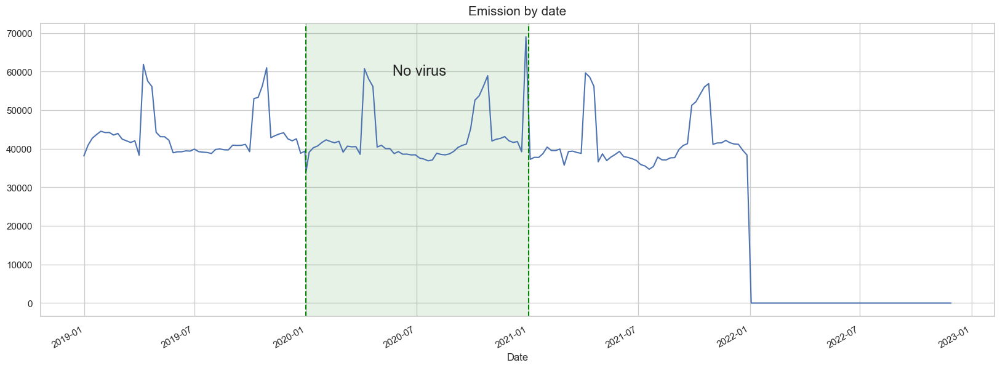

In [28]:
df.groupby(['date'])['emission'].sum().plot(kind='line', figsize=(20, 7), xlabel='Date')

plt.axvspan(pd.Timestamp('2020-01-01'), pd.Timestamp('2021-01-01'), color='green', alpha=0.1)
plt.axvline(pd.Timestamp('2020-01-01'), linestyle = "--", color='green')
plt.axvline(pd.Timestamp('2021-01-01'), linestyle = "--", color='green')

plt.text(pd.Timestamp('2020-05-22'), 59000, "No virus", size = 17)

plt.title('Emission by date', size=15, pad=10)
plt.show()

# Machine Learning:

### Feature selection

In [29]:
training_cols = ['latitude', 'longitude', 'year', 'week_sin', 'week_cos', 'month_sin', 'month_cos', 'season_sin', 'season_cos', 'holidays', 'rot_15_x', 'rot_15_y', 'rot_30_x', 'rot_30_y']

### Dimentionality reduction

In [30]:
cols_to_pca = df.columns[5:68]

data_to_pca = df[cols_to_pca]

scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_to_pca)

n_components = 5
pca = PCA(n_components = n_components)
pca_result = pca.fit_transform(data_scaled)

pca_columns = [f'PC{i+1}' for i in range(n_components)]
pca_df = pd.DataFrame(data = pca_result, columns = pca_columns)

df_reset_index = df.reset_index(drop = True)

df = pd.concat([df_reset_index, pca_df], axis=1)

In [31]:
# rotation location
df['rot_15_x'] = (np.cos(np.radians(15)) * df['longitude']) + (np.sin(np.radians(15)) * df['latitude'])

df['rot_15_y'] = (np.cos(np.radians(15)) * df['latitude']) + (np.sin(np.radians(15)) * df['longitude'])

df['rot_30_x'] = (np.cos(np.radians(30)) * df['longitude']) + (np.sin(np.radians(30)) * df['latitude'])

df['rot_30_y'] = (np.cos(np.radians(30)) * df['latitude']) + (np.sin(np.radians(30)) * df['longitude'])

In [32]:
# Season
df['season'] = df['date'].dt.month.apply(lambda x: 1 if 3 <= x <= 5 else 2 if 6 <= x <= 8 else 3 if 9 <= x <= 11 else 4)

In [33]:
# Holidays
df['holidays'] = (df['week_no'].isin([0, 51, 12, 30]))

In [34]:
# Cyclic feature
df['month_sin'] = np.sin(2 * np.pi * df['date'].dt.month/12)
df['month_cos'] = np.cos(2 * np.pi * df['date'].dt.month/12)

df['week_sin'] = np.sin(2 * np.pi * df['week_no']/53)
df['week_cos'] = np.cos(2 * np.pi * df['week_no']/53)

df['season_sin'] = np.sin(2 * np.pi * df['season']/4)
df['season_cos'] = np.cos(2 * np.pi * df['season']/4)

### Modeling

In [35]:
features = [
            'rot_15_x', 'rot_15_y', 'rot_30_x', 'rot_30_y',
            'season', 'holidays', 'month_sin', 'month_cos', 'week_sin',
            'week_cos', 'season_sin', 'season_cos'
           ]

target = 'emission'

In [36]:
train = df.loc[df['test'] == 0]
test = df.loc[df['test'] == 1]

X, y = train[features], train[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state=42)

In [37]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),          
    ('model', XGBRegressor(
        base_score=0.6797320649643039,
        colsample_bytree=0.7190145932204617,
        gamma=2.6331011856384623,
        learning_rate=0.07185561294859627,
        max_depth=8,
        min_child_weight=7,
        n_estimators=712,
        num_parallel_tree=7,
        reg_alpha=0.3530838455279714,
        reg_lambda=0.6594262286990963,
        scale_pos_weight=5.6168915454194925,
        subsample=0.9411952436312716,
        random_state=42,
        tree_method='hist'  # Set tree_method to 'hist' for CPU-based computation
    ))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

In [38]:
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'RMSE: {rmse:.2f}')

RMSE: 18.24


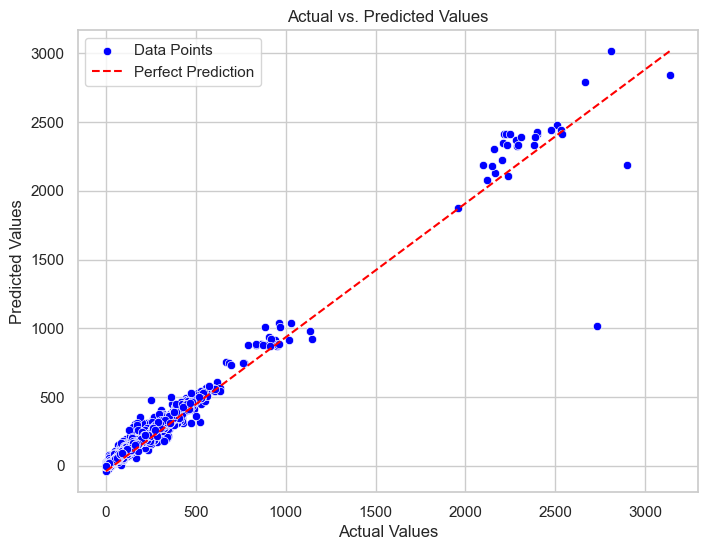

In [39]:
sns.set(style="whitegrid")

plt.figure(figsize=(8, 6))

data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

sns.scatterplot(data=data, x='Actual', y='Predicted', color='blue', label='Data Points')

plt.plot([min(y_test), max(y_test)], [min(y_pred), max(y_pred)], color='red', linestyle='--', label='Perfect Prediction')

plt.title('Actual vs. Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

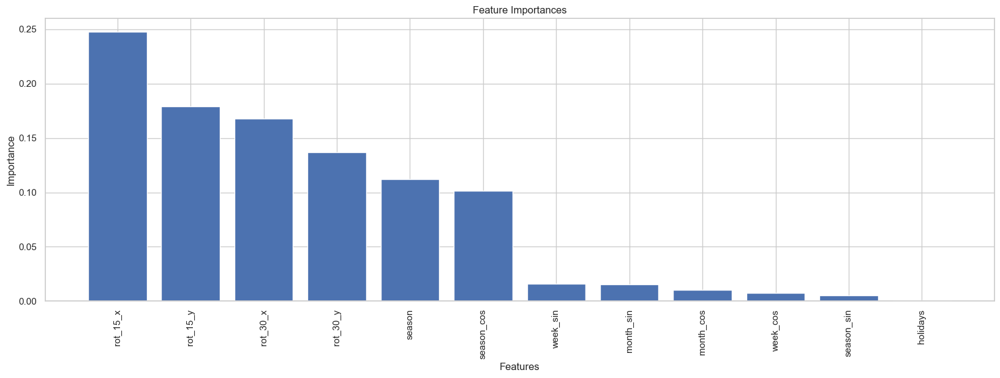

In [40]:
xgb_model = pipeline.named_steps['model']

importances = xgb_model.feature_importances_

feature_names = X_train.columns

sorted_idx = np.argsort(importances)[::-1]

plt.figure(figsize=(20, 6))
plt.bar(range(len(importances)), importances[sorted_idx])
plt.xticks(range(len(importances)), np.array(feature_names)[sorted_idx], rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance")
plt.title("Feature Importances")
plt.show()

## Submission:

In [41]:
sample.head()

,ID_LAT_LON_YEAR_WEEK,emission
0,ID_-0.510_29.290_2022_00,81.94
1,ID_-0.510_29.290_2022_01,81.94
2,ID_-0.510_29.290_2022_02,81.94
3,ID_-0.510_29.290_2022_03,81.94
4,ID_-0.510_29.290_2022_04,81.94


In [42]:
sample['emission'] = pipeline.predict(test[features])

In [43]:
sample.head()

,ID_LAT_LON_YEAR_WEEK,emission
0,ID_-0.510_29.290_2022_00,5.390265
1,ID_-0.510_29.290_2022_01,3.758652
2,ID_-0.510_29.290_2022_02,4.556701
3,ID_-0.510_29.290_2022_03,3.569298
4,ID_-0.510_29.290_2022_04,4.213826


In [44]:
sample.to_csv('submission.csv', index=False)